In [1]:
import streamlit as st
from PIL import Image
from skimage import data
from skimage import transform
from skimage.feature import blob_log
from matplotlib import pyplot as plt
from skyfield.api import Star, Topos, load
from skyfield.data import hipparcos
import numpy as np
import os
import time
import pickle
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

with load.open(hipparcos.URL) as f:
    df = hipparcos.load_dataframe(f)

In [2]:
stardict = {}
with open('common_stars.txt') as f:
    lines = f.readlines()
    for line in lines:
        entry = line.strip().split("\t")
        stardict[int(entry[1])] = entry[0]
        stardict[int(entry[3])] = entry[2]

df = df[df['magnitude'] <= 3.0]
print('After filtering, there are {} stars'.format(len(df)))
bright_stars = Star.from_dataframe(df)

planets = load('de421.bsp')
earth = planets['earth']
ts = load.timescale()


After filtering, there are 177 stars


In [3]:
# Our function to fit is going to be a sum of two-dimensional Gaussians
def gaussian(x, y, x0, y0, xalpha, yalpha, A):
    return A * np.exp( -((x-x0)/xalpha)**2 -((y-y0)/yalpha)**2)

def _gaussian(M, *args):
    x, y = M
    arr = np.zeros(x.shape)
    for i in range(len(args)//5):
       arr += gaussian(x, y, *args[i*5:i*5+5])
    return arr

streamlit/pic000000.dat 147
streamlit/pic000010.dat 223
streamlit/pic000020.dat 230
streamlit/pic000030.dat 211
streamlit/pic000040.dat 225
streamlit/pic000050.dat 175
streamlit/pic000060.dat 212
streamlit/pic000070.dat 228
streamlit/pic000080.dat 227
streamlit/pic000090.dat 226
streamlit/pic000100.dat 219
streamlit/pic000110.dat 224
streamlit/pic000120.dat 232
streamlit/pic000130.dat 224
streamlit/pic000140.dat 218
streamlit/pic000150.dat 222
streamlit/pic000160.dat 230
streamlit/pic000170.dat 226
streamlit/pic000180.dat 227
streamlit/pic000190.dat 220
streamlit/pic000200.dat 223
streamlit/pic000210.dat 222
streamlit/pic000220.dat 200
streamlit/pic000230.dat 207
streamlit/pic000240.dat 211
streamlit/pic000250.dat 220
streamlit/pic000260.dat 217
streamlit/pic000270.dat 245
streamlit/pic000280.dat 204
streamlit/pic000290.dat 204
streamlit/pic000300.dat 206
streamlit/pic000310.dat 199
streamlit/pic000320.dat 235
streamlit/pic000330.dat 221
streamlit/pic000340.dat 228
streamlit/pic000350.

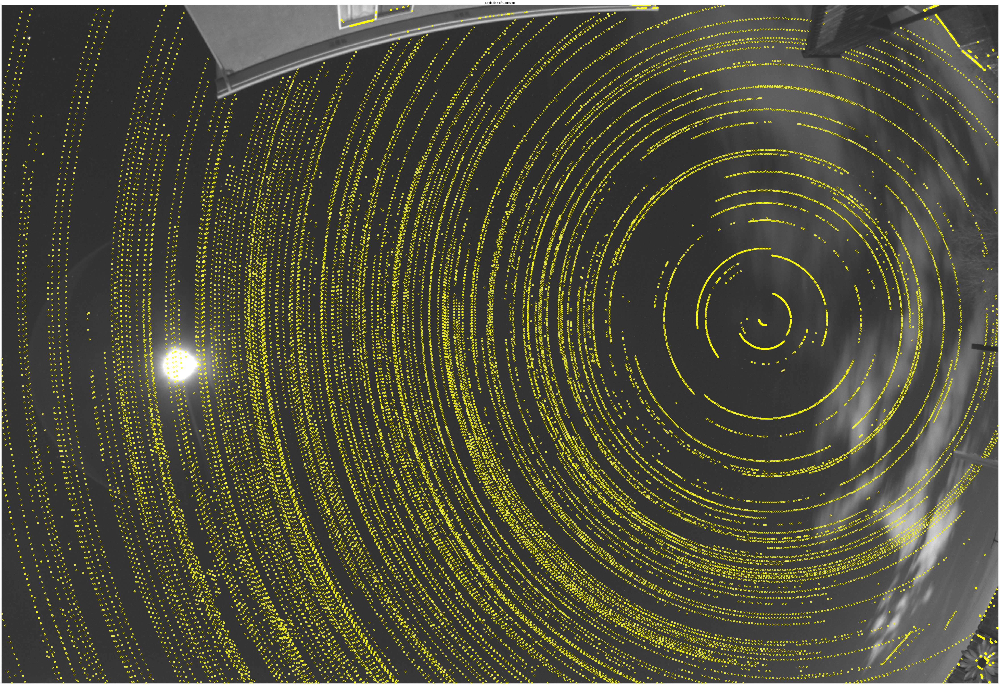

In [4]:
def getMag(parray, blobs):
    ret = np.zeros((len(blobs), 4))
    mx,my = parray.shape
    mx-=1
    my-=1
    for cnt,blob in enumerate(blobs):
        x,y,r = blob
#         y = my+1-y
        ret[cnt,:3] = blob
        startx = int(x-2)
        starty = int(y-2)
        endx = int(x+2)
        endy = int(y+2)
        if startx < 0:
            startx = 0
        if starty < 0:
            starty = 0
        if endx > mx:
            endx = mx
        if endy > my:
            endy = my        
        test = parray[startx:endx,starty:endy].shape
        if test[0] > 0 and test[1] > 0:
            vv = np.average(parray[startx:endx,starty:endy])
            ret[cnt,3] = np.max(parray[startx:endx,starty:endy]) / vv
#             break
    return ret

fig, ax = plt.subplots(1, 1, figsize=(80, 80), sharex=True, sharey=True)
myblobs = []

thresh = 0.002

for cc in range(180):
# for cc in range(1):
    fname = f"streamlit/pic{cc*10:06d}.dat"
    
    raw = np.fromfile(fname, dtype=np.float64).reshape((2822,4144))
#     print(raw.shape)

    tstamp = os.path.getmtime(fname)
#     print(tstamp)

    timestamp = datetime.fromtimestamp(tstamp)
#     print(timestamp.year)

    parray = 0.2125*raw[::2,::2] + 0.7154 * (raw[1::2,::2] + raw[::2,1::2]) / 2.0 + 0.0721 * raw[1::2,1::2]
    out = parray / np.max(parray)
    
    
    blobs_log = blob_log(out, max_sigma=120, num_sigma=5, threshold=thresh)
    
    while len(blobs_log) < 220:
        thresh *= 0.8
        blobs_log = blob_log(out, max_sigma=120, num_sigma=5, threshold=thresh)
        
    while len(blobs_log) > 250:
        thresh /= 0.8
        blobs_log = blob_log(out, max_sigma=120, num_sigma=5, threshold=thresh)

    # Compute radii in the 3rd column.
#     print(thresh)
    blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)
    blobs_log = blobs_log[np.where(blobs_log[:,2] <= 2)]
    blobs_log = getMag(parray, blobs_log)
    
#     print(blobs_log[:,3])
    swgain = 20
    print(fname, len(blobs_log))
    myblobs.append(blobs_log)

    blobs_list = [blobs_log]
    colors = ['yellow']
    titles = ['Laplacian of Gaussian']
    sequence = zip(blobs_list, colors, titles)

    # ax = axes.ravel()
    # ax[1].imshow(immask, cmap='gray', interpolation='none')
    # ax[1].set_title("Mask using variance")

    for idx, (blobs, color, title) in enumerate(sequence):
        ax.set_title(title)
        if cc == 0:
            ax.imshow(out*swgain, cmap='gray', interpolation='none',vmin=0.1, vmax=0.6)
        for blob in blobs:
            y, x, r, mag = blob
            if mag > 0:
                c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
                ax.add_patch(c)
        ax.set_axis_off()


cos = earth + Topos('38.8605998 N', '104.6751112 W', elevation_m=2000)
plt.show()

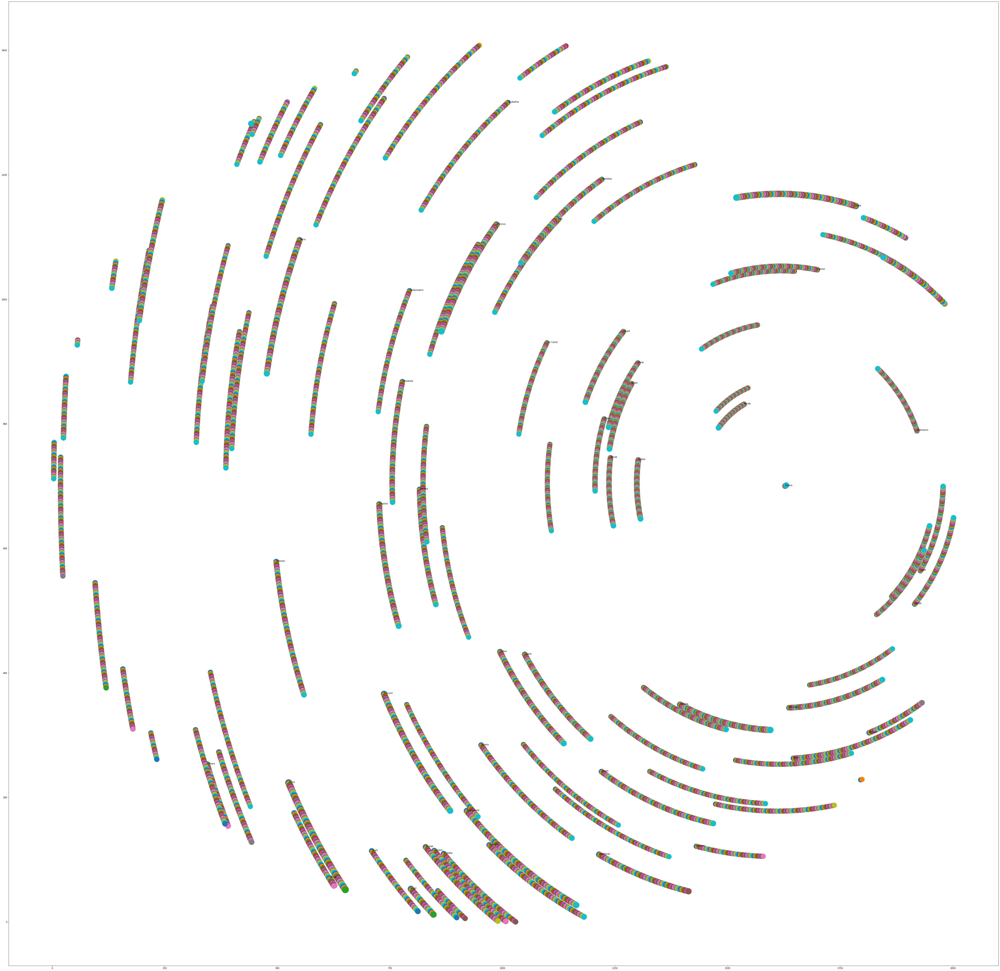

In [5]:
pickle.dump( myblobs, open( "blobs.p", "wb" ) )
fig, ax = plt.subplots(1, 1, figsize=(80, 80), sharex=True, sharey=True)

for cnt in range(100):
    t = ts.utc(timestamp.year, 
               timestamp.month, 
               timestamp.day, 
               timestamp.hour,
               timestamp.minute+cnt,
               timestamp.second)
#     print(t)
#     astrometric = boston.at(t).observe(bright_stars)
    apparent = cos.at(t).observe(bright_stars).apparent()
#     ra, dec, distance = apparent.radec('date')
    alt,az,distance = apparent.altaz()
    az_deg = np.pi*np.array(az.degrees) / 180
#     ax.scatter(az_deg, 90 - alt.degrees, 50*df['magnitude'], 'k')
    hips = df.index
    rad = 90 - alt.degrees
    idxs = np.where(rad < 90)
    mag = np.array(10*(8-df['magnitude']))
    x = (rad[idxs]*np.cos(az_deg[idxs])/180 + 0.5) * 4144/2
    y = (rad[idxs]*np.sin(az_deg[idxs])/180 + 0.5) * 2822/2
    hipvals = hips[idxs]
    ax.scatter(x, y,mag[idxs]*10)
#     print(np.min(x),np.max(x),np.min(y),np.max(y))
    
    if cnt == 0:
        for idx,hip in enumerate(hipvals):
            if hip in stardict:
                ax.annotate(stardict[hip], (x[idx], y[idx]))

plt.show()